In [1]:
# Auto-reload modules for development
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
project_root = '/home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm'
notebooks_root = '/home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm/CE'
if project_root not in sys.path:
    sys.path.insert(0, project_root)
    sys.path.insert(0, notebooks_root)

# Set the current working directory
os.chdir(project_root)
print(f"Current working directory: {os.getcwd()}")
from utils.utils import save_image_grid_with_labels, get_concept_index
import argparse
import numpy as np
from pathlib import Path
import yaml
import torch
from ast import literal_eval
from torch.autograd import Variable
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
from torch import nn
from models import cbae_stygan2
from torchvision import transforms, models
from utils import gan_loss
import itertools
import warnings
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
from eval.eval_intervention_gan import opt_int
import time

from CE_utils import store_ce_images, opt_int_multi


Current working directory: /home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm


In [3]:
# dataset to evaluate on
dataset = 'celebahq'
# experiment name
expt_name = 'cc_stygan2_thr90'
# tensorboard name
tensorboard_name = 'sup_pl_cls8'

optint_eps = 0.1
optint_iters = 50

device = 'cuda:1'

In [4]:
config_file = f"./config/{expt_name}/"+dataset+".yaml"

with open(config_file, 'r') as stream:
    config = yaml.safe_load(stream)
print(f"Loaded configuration file {config_file}")
config_file = f"./config/{expt_name}/"+dataset+".yaml"

with open(config_file, 'r') as stream:
    config = yaml.safe_load(stream)
print(f"Loaded configuration file {config_file}")


num_cls = 8
set_of_classes = [
    ['NOT Attractive', 'Attractive'],
    ['NO Lipstick', 'Wearing Lipstick'],
    ['Mouth Closed', 'Mouth Slightly Open'],
    ['NOT Smiling', 'Smiling'],
    ['Low Cheekbones', 'High Cheekbones'],
    ['NO Makeup', 'Heavy Makeup'],
    ['Female', 'Male'],
    ['Straight Eyebrows', 'Arched Eyebrows']
]
conc_clsf_classes = [
    'Attractive',
    'Wearing_Lipstick',
    'Mouth_Slightly_Open',
    'Smiling',
    'High_Cheekbones',
    'Heavy_Makeup',
    'Male',
    'Arched_Eyebrows',
]

# config['model']['pretrained'] = 'models/checkpoints/stylegan2-celebahq-256x256.pkl'
# model = cbae_stygan2.cbAE_StyGAN2(config)
model = cbae_stygan2.CC_StyGAN2(config)

cbae_ckpt_path = f'models/checkpoints/{dataset}_{expt_name}_{tensorboard_name}_cc.pt'

model.cbae.load_state_dict(torch.load(cbae_ckpt_path, map_location='cpu'))
model.to(device)
model.eval();

Loaded configuration file ./config/cc_stygan2_thr90/celebahq.yaml
Loaded configuration file ./config/cc_stygan2_thr90/celebahq.yaml
loading stylegan2 from models/checkpoints/stylegan2-celebahq-256x256.pkl
number of layers in CB-E: 10


In [ ]:
seed = 43
torch.manual_seed(seed)
np.random.seed(seed)

# Generate a single latent vector from the seed
z = torch.randn((1, model.gen.z_dim), device=device)
latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

# Generate all combinations of 8 binary concepts (2^8 = 256 combinations)
num_concepts = 8
all_combinations = list(itertools.product([0, 1], repeat=num_concepts))

print(f"Total combinations: {len(all_combinations)}")
print(f"Concepts: {conc_clsf_classes}")
print(f"Using CC optimization-based intervention with eps={optint_eps}, iters={optint_iters}")

# Store all generated images
all_images = []

# Generate images for all combinations
for combo in tqdm(all_combinations):
    # Start with the original latent for each combination
    new_latent = latent.clone()
    
    # Apply optimization-based intervention for each concept sequentially
    for concept_idx, concept_val in enumerate(combo):
        with torch.enable_grad():
            new_latent = opt_int(
                model, 
                new_latent, 
                concept_change=concept_idx, 
                
                concept_value=concept_val, 
                num_iters=optint_iters, 
                eps=optint_eps,
                device=device
            )
    
    # Generate image from the intervened latent
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    all_images.append(gen_img.detach().cpu())

# Concatenate all images
all_images_tensor = torch.cat(all_images, dim=0)
print(f"Generated {len(all_images_tensor)} images with shape {all_images_tensor.shape}")


Total combinations: 256
Concepts: ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']
Using CC optimization-based intervention with eps=0.1, iters=50


100%|██████████| 256/256 [16:03<00:00,  3.76s/it]  

Generated 256 images with shape torch.Size([256, 3, 256, 256])


In [16]:
# ========================================
# NEW: Multi-concept optimization (all concepts at once)
# ========================================

seed = 50
torch.manual_seed(seed)
np.random.seed(seed)

# Generate a single latent vector from the seed
z = torch.randn((1, model.gen.z_dim), device=device)
latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

# Generate all combinations of 8 binary concepts (2^8 = 256 combinations)
num_concepts = 8
all_combinations = list(itertools.product([0, 1], repeat=num_concepts))

print(f"Total combinations: {len(all_combinations)}")
print(f"Concepts: {conc_clsf_classes}")
print(f"Using CC optimization-based intervention (MULTI-CONCEPT) with eps={optint_eps}, iters={optint_iters}")

# Store all generated images
all_images_multi = []

# Measure time
start_time = time.time()

# Generate images for all combinations using multi-concept optimization
for combo in tqdm(all_combinations, desc="Multi-concept optimization"):
    # Optimize for all concepts simultaneously
    with torch.enable_grad():
        new_latent = opt_int_multi(
            model, 
            latent.clone(), 
            concept_values=combo,  # Pass all concept values at once
            num_iters=optint_iters, 
            eps=optint_eps,
            device=device
        )
    
    # Generate image from the intervened latent
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    all_images_multi.append(gen_img.detach().cpu())

end_time = time.time()
elapsed_time = end_time - start_time

# Concatenate all images
all_images_tensor = torch.cat(all_images_multi, dim=0)
print(f"Generated {len(all_images_tensor)} images with shape {all_images_tensor.shape}")
print(f"Time elapsed: {elapsed_time:.2f} seconds ({elapsed_time/60:.2f} minutes)")
print(f"Average time per combination: {elapsed_time/len(all_combinations):.3f} seconds")


Total combinations: 256
Concepts: ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']
Using CC optimization-based intervention (MULTI-CONCEPT) with eps=0.1, iters=50


Multi-concept optimization:   0%|          | 0/256 [00:00<?, ?it/s]

Multi-concept optimization: 100%|██████████| 256/256 [00:20<00:00, 12.28it/s]

Generated 256 images with shape torch.Size([256, 3, 256, 256])
Time elapsed: 20.84 seconds (0.35 minutes)
Average time per combination: 0.081 seconds


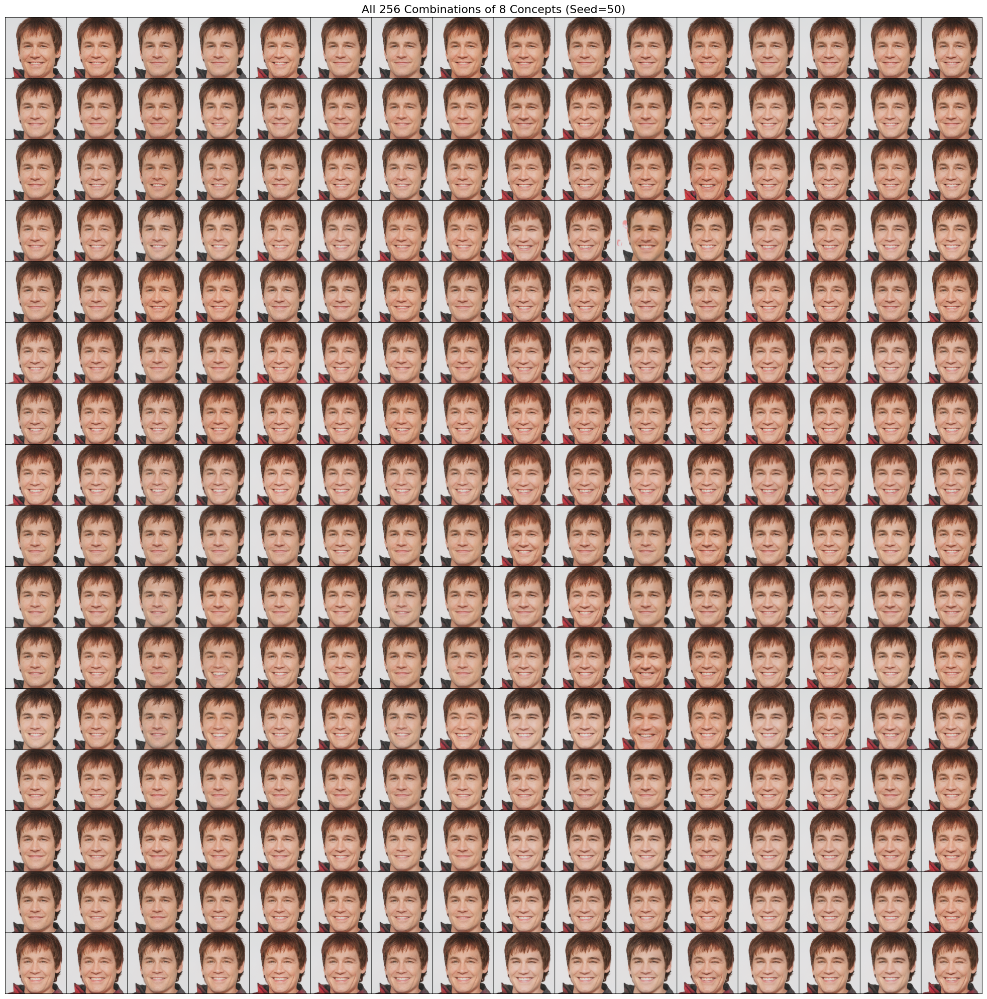


Concepts (in order): ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']
Total combinations shown: 256


In [17]:
# Create a grid visualization of all 256 combinations (16x16 grid)
grid = make_grid(all_images_tensor, nrow=16, padding=2, normalize=True)

# Display the grid
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
npimg = grid.numpy()
npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
ax.imshow(npimg)
ax.set_title(f'All 256 Combinations of 8 Concepts (Seed={seed})', fontsize=16)
ax.axis('off')

plt.tight_layout()
plt.show()

print(f"\nConcepts (in order): {conc_clsf_classes}")
print(f"Total combinations shown: {len(all_combinations)}")


In [ ]:
# ========================================
# Interesting Examples: Specific Concept Combinations
# ========================================

# Define semantically interesting combinations
# Format: (concept_values, description)
# Concepts: Attractive, Lipstick, Mouth_Open, Smiling, High_Cheekbones, Heavy_Makeup, Male, Arched_Eyebrows

interesting_examples = [
    # Classic feminine looks
    ([1, 1, 0, 1, 1, 1, 0, 1], "Attractive Female: Full makeup, smiling"),
    ([1, 1, 1, 1, 1, 1, 0, 1], "Attractive Female: Full makeup, smiling, mouth open"),
    ([1, 0, 0, 1, 1, 0, 0, 0], "Attractive Female: Natural, smiling"),
    ([1, 0, 0, 0, 1, 0, 0, 0], "Attractive Female: Natural, serious"),
    
    # Masculine looks
    ([1, 0, 0, 1, 1, 0, 1, 0], "Attractive Male: Smiling"),
    ([1, 0, 0, 0, 1, 0, 1, 0], "Attractive Male: Serious"),
    ([0, 0, 1, 0, 0, 0, 1, 0], "Male: Mouth open, no smile"),
    
    # Contrasting expressions
    ([1, 1, 0, 0, 1, 1, 0, 1], "Attractive Female: Makeup but serious"),
    ([1, 0, 1, 0, 1, 0, 0, 0], "Attractive Female: Mouth open, not smiling"),
    
    # Minimal features
    ([0, 0, 0, 0, 0, 0, 0, 0], "All features at 0"),
    ([1, 1, 1, 1, 1, 1, 0, 1], "All female features at 1"),
    ([1, 0, 1, 1, 1, 0, 1, 0], "All male features at 1"),
]

# Generate images for these interesting combinations using multi-concept optimization
print("Generating interesting examples using multi-concept optimization...")
print(f"\nConcepts order: {conc_clsf_classes}\n")

interesting_images = []
for concept_vals, desc in tqdm(interesting_examples, desc="Generating examples"):
    with torch.enable_grad():
        new_latent = opt_int_multi(
            model, 
            latent.clone(), 
            concept_values=concept_vals,
            num_iters=optint_iters, 
            eps=optint_eps,
            device=device
        )
    
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    interesting_images.append(gen_img.detach().cpu())

print(f"\nGenerated {len(interesting_images)} interesting examples!")


Generating interesting examples using multi-concept optimization...

Concepts order: ['Attractive', 'Wearing_Lipstick', 'Mouth_Slightly_Open', 'Smiling', 'High_Cheekbones', 'Heavy_Makeup', 'Male', 'Arched_Eyebrows']



Generating examples:   0%|          | 0/12 [00:00<?, ?it/s]

Generating examples: 100%|██████████| 12/12 [00:00<00:00, 12.20it/s]


Generated 12 interesting examples!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

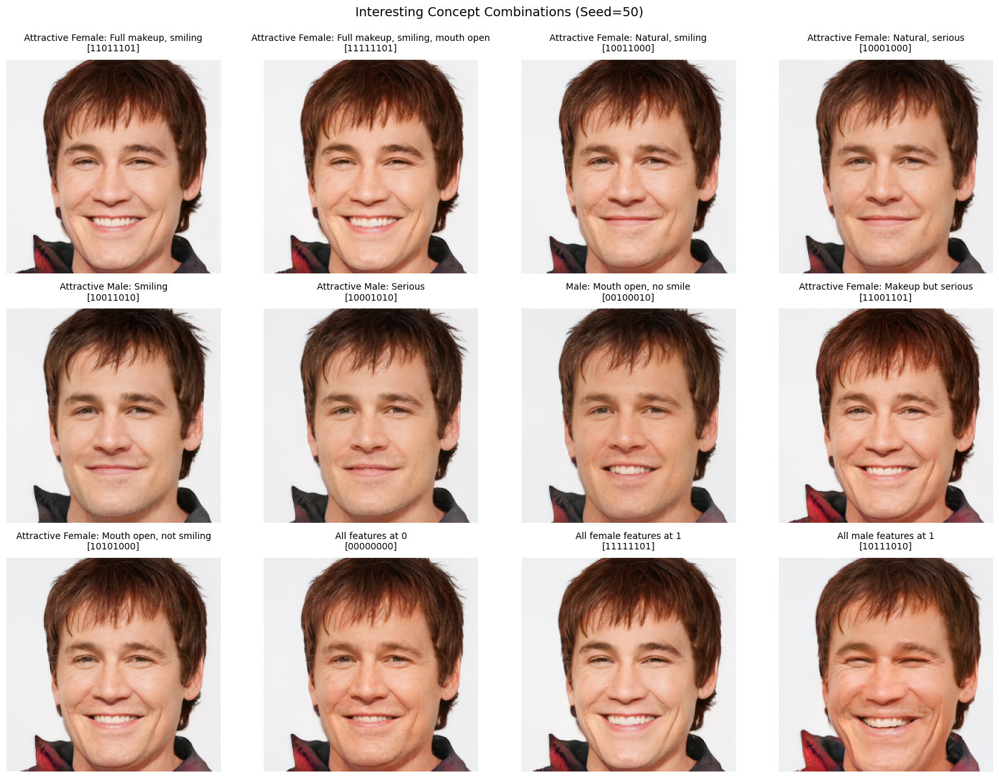


Concept Index Mapping:
  0: Attractive
  1: Wearing_Lipstick
  2: Mouth_Slightly_Open
  3: Smiling
  4: High_Cheekbones
  5: Heavy_Makeup
  6: Male
  7: Arched_Eyebrows


In [19]:
# ========================================
# Visualize Interesting Examples
# ========================================

# Create a figure with all interesting examples
n_examples = len(interesting_examples)
n_cols = 4
n_rows = (n_examples + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 4))
axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes

for idx, ((concept_vals, desc), img_tensor) in enumerate(zip(interesting_examples, interesting_images)):
    img = img_tensor.squeeze(0).numpy().transpose(1, 2, 0)
    axes[idx].imshow(img)
    
    # Create title with binary string and description
    binary_str = ''.join(map(str, concept_vals))
    axes[idx].set_title(f"{desc}\n[{binary_str}]", fontsize=10, pad=10)
    axes[idx].axis('off')

# Hide any unused subplots
for idx in range(n_examples, len(axes)):
    axes[idx].axis('off')

plt.suptitle(f'Interesting Concept Combinations (Seed={seed})', fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

# Print concept mapping for reference
print("\nConcept Index Mapping:")
for i, concept in enumerate(conc_clsf_classes):
    print(f"  {i}: {concept}")


Demonstrating concept transitions...
Base configuration: [1, 0, 0, 1, 1, 0, 0, 0]
Description: Attractive Female, Natural, Smiling



Generating transitions:   0%|          | 0/8 [00:00<?, ?it/s]

Generating transitions: 100%|██████████| 8/8 [00:00<00:00, 11.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


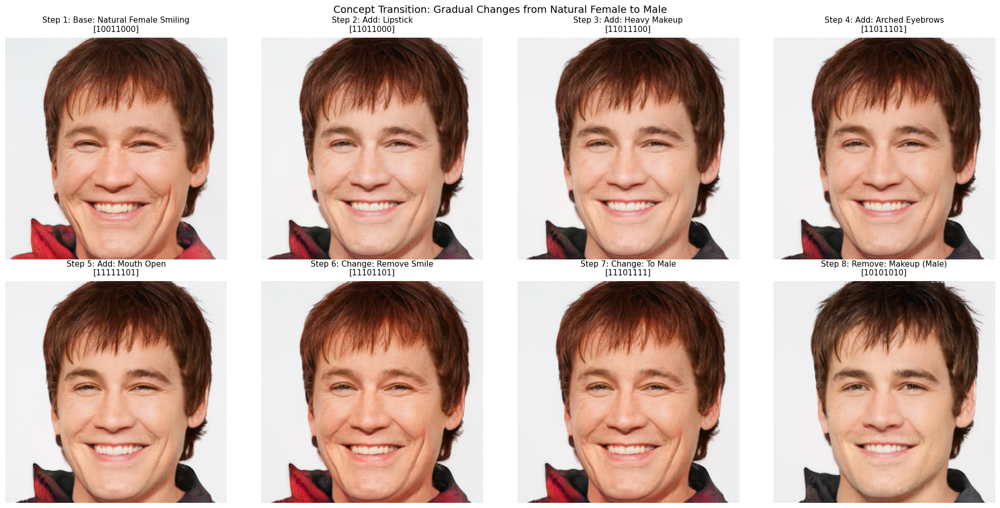


Transition complete! Notice how each step modifies specific facial attributes.


In [ ]:
# ========================================
# Concept Transitions: Gradual Changes
# ========================================

# Show how changing one concept at a time affects the image
print("Demonstrating concept transitions...")

# Start with a base configuration
base_config = [1, 0, 0, 1, 1, 0, 0, 0]  # Attractive Female: Natural, smiling
print(f"Base configuration: {base_config}")
print(f"Description: Attractive Female, Natural, Smiling\n")

# Define transitions - change one concept at a time
transitions = [
    (base_config.copy(), "Base: Natural Female Smiling"),
    ([1, 1, 0, 1, 1, 0, 0, 0], "Add: Lipstick"),
    ([1, 1, 0, 1, 1, 1, 0, 0], "Add: Heavy Makeup"),
    ([1, 1, 0, 1, 1, 1, 0, 1], "Add: Arched Eyebrows"),
    ([1, 1, 1, 1, 1, 1, 0, 1], "Add: Mouth Open"),
    ([1, 1, 1, 0, 1, 1, 0, 1], "Change: Remove Smile"),
    ([1, 1, 1, 0, 1, 1, 1, 1], "Change: To Male"),
    ([1, 0, 1, 0, 1, 0, 1, 0], "Remove: Makeup (Male)"),
]

transition_images = []
for concept_vals, desc in tqdm(transitions, desc="Generating transitions"):
    with torch.enable_grad():
        new_latent = opt_int_multi(
            model, 
            latent.clone(), 
            concept_values=concept_vals,
            num_iters=optint_iters, 
            eps=optint_eps,
            device=device
        )
    
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    transition_images.append(gen_img.detach().cpu())

# Visualize transitions
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, ((concept_vals, desc), img_tensor) in enumerate(zip(transitions, transition_images)):
    img = img_tensor.squeeze(0).numpy().transpose(1, 2, 0)
    axes[idx].imshow(img)
    
    binary_str = ''.join(map(str, concept_vals))
    axes[idx].set_title(f"Step {idx+1}: {desc}\n[{binary_str}]", fontsize=11, pad=8)
    axes[idx].axis('off')

plt.suptitle('Concept Transition: Gradual Changes from Natural Female to Male', fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

print("\nTransition complete! Notice how each step modifies specific facial attributes.")
